===== Young’s Modulus from Displacement vs. Force =====
Stiffness (slope): 0.9903 N/m
Young’s Modulus: 7.47e+09 Pa = 7.47 GPa


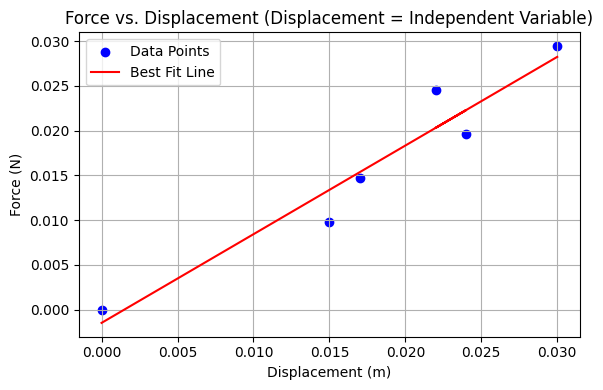

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# === Experimental constants ===
L = 0.074        # overhang length in meters
b = 0.215        # width in meters
h = 0.0001       # thickness in meters
g = 9.81         # gravity in m/s²

# === Data: input your measurements ===
# Displacement in meters, Mass in grams
disp_m = np.array([0.000, 0.015, 0.017, 0.024,0.022, 0.030,])     # displacement (independent variable)
mass_g = np.array([0.0, 1.0, 1.5, 2.0, 2.5, 3.0,])           # mass in grams

# === Convert to force in Newtons ===
mass_kg = mass_g / 1000
force_N = mass_kg * g

# === Reshape for sklearn linear regression
X = disp_m.reshape(-1, 1)    # Displacement (independent)
y = force_N                  # Force (dependent)

# === Linear regression
model = LinearRegression().fit(X, y)
slope = model.coef_[0]       # k = F / δ

# === Calculate Young’s Modulus ===
I = (b * h**3) / 12
E = (slope * L**3) / (3 * I)
E_GPa = E / 1e9

# === Output
print("===== Young’s Modulus from Displacement vs. Force =====")
print(f"Stiffness (slope): {slope:.4f} N/m")
print(f"Young’s Modulus: {E:.2e} Pa = {E_GPa:.2f} GPa")

# === Plotting
plt.figure(figsize=(6, 4))
plt.scatter(disp_m, force_N, color='blue', label='Data Points')
plt.plot(disp_m, model.predict(X), color='red', label='Best Fit Line')
plt.xlabel("Displacement (m)")
plt.ylabel("Force (N)")
plt.title("Force vs. Displacement (Displacement = Independent Variable)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

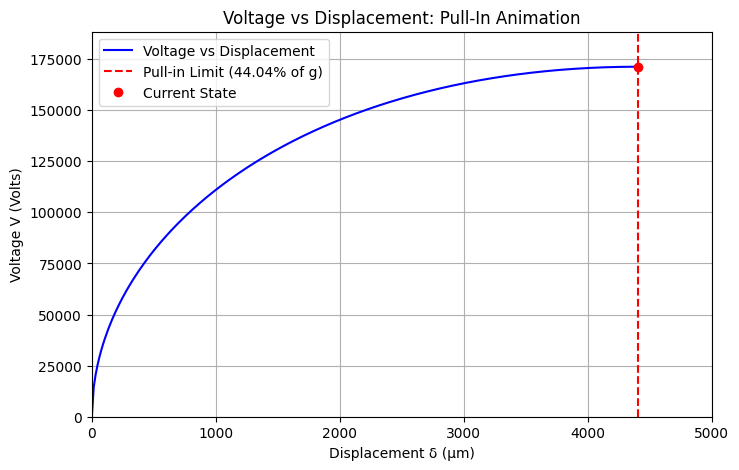

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# Constants
epsilon_0 = 8.854e-12  # Permittivity of free space (F/m)
E = 7.47e+9             # Young's modulus (Pa)
t = 0.0001               # Thickness (m)
L = 0.01            # Length (m)
g = 0.01               # Initial gap (m)

# Equation for voltage vs. displacement (from pivot model)
def voltage(delta):
    log_term = np.log(g / (g - delta))
    numerator = (21 / 25) * (E * t**3 * delta**3 * (g - delta))
    denominator = epsilon_0 * L**4 * (delta - log_term * (g - delta))
    return np.sqrt(numerator / denominator)

# Generate displacement and voltage data
delta_vals = np.linspace(0.01e-6, 0.4404 * g, 300)
voltage_vals = voltage(delta_vals)

# Create plot
fig, ax = plt.subplots(figsize=(8, 5))
line, = ax.plot([], [], 'b', label='Voltage vs Displacement')
pullin_line = ax.axvline(x=0.4404 * g * 1e6, color='red', linestyle='--', label='Pull-in Limit (44.04% of g)')
point, = ax.plot([], [], 'ro', label='Current State')

# Set axis labels and limits
ax.set_xlim(0, 0.5 * g * 1e6)
ax.set_ylim(0, max(voltage_vals) * 1.1)
ax.set_title('Voltage vs Displacement: Pull-In Animation')
ax.set_xlabel('Displacement δ (µm)')
ax.set_ylabel('Voltage V (Volts)')
ax.grid(True)
ax.legend()

# Initialization function
def init():
    line.set_data(delta_vals * 1e6, voltage_vals)
    point.set_data([], [])
    return line, point
print("The max voltage is: ", max(voltage_vals))
# Animation function
def animate(i):
    x = delta_vals[i] * 1e6
    y = voltage_vals[i]
    point.set_data([x], [y])  # Wrap in lists to ensure they are sequences
    return point,

# Run animation
ani = animation.FuncAnimation(fig, animate, frames=len(delta_vals),
                              init_func=init, blit=True, interval=30, repeat=False)

# To display the animation inside Jupyter Notebook
from IPython.display import HTML
HTML(ani.to_jshtml())


In [5]:
pip install matplotlib numpy scikit-learn

Note: you may need to restart the kernel to use updated packages.
